In [2]:
import numpy as np
from sklearn.decomposition import PCA
n_sample = 10
n_feature = 100
X = np.array(np.random.randn(n_sample, n_feature))
pca = PCA(n_components=2)
pca.fit(X)
print(pca.explained_variance_ratio_)
print(pca.singular_values_)

[0.16329783 0.14883012]
[11.84898037 11.31191637]


In [3]:
def orthogonal_projection(X):
    U, s, V = np.linalg.svd(X)
    Ur = U[:, :s.shape[0]]
    return Ur @ Ur.T 

In [18]:
X = np.array([[2,1,2,3],[1,2,1,1]]).T
Px = orthogonal_projection(X)
d = np.array([1,3,1,2])
ls = np.linalg.norm(Px @ d - d)
project = Px @ d
print(ls)
print(project)

0.8432740427115677
[1.44444444 2.82222222 1.44444444 1.46666667]


In [19]:
# X *w =b 最小二乘
X = np.array([[2,1,2,3],[1,2,1,1]]).T
y = np.array([1,3,1,2])
w = np.linalg.pinv(X) @ y
print(w)
print(X @ w)
print(np.linalg.norm(X @ w - y))

[0.02222222 1.4       ]
[1.44444444 2.82222222 1.44444444 1.46666667]
0.8432740427115677


In [17]:
X@w

array([1.44444444, 2.82222222, 1.44444444, 1.46666667])

In [9]:
A = np.array([[1,-1,1,-1,2],[2,1,2,1,1]]).T
B = np.array([[2,-1,1,-1,1],[1,1,2,1,2]]).T
Ua, Sa, Va = np.linalg.svd(A)
Ua1 = Ua[:,0:Sa.shape[0]]
PsA = Ua1 @ Ua1.T
Ub, Sb, Vb = np.linalg.svd(B)
Ub1 = Ub[:,0:Sb.shape[0]]
PsB = Ub1 @ Ub1.T
x = np.array([1,1,1,1,0])

In [33]:
intersection = np.hstack((A,B))
# find null space
U, S, V = np.linalg.svd(intersection)
rank = np.linalg.matrix_rank(intersection)
V2 = V.T[:,rank:]

In [46]:
orthogonal_projection(intersection)

array([[ 0.94672351, -0.15859845,  0.10655299,  0.10532196, -0.05327649],
       [-0.15859845,  0.52786927,  0.31719691,  0.31353227, -0.15859845],
       [ 0.10655299,  0.31719691,  0.78689402, -0.21064392,  0.10655299],
       [ 0.10532196,  0.31353227, -0.21064392,  0.79178969,  0.10532196],
       [-0.05327649, -0.15859845,  0.10655299,  0.10532196,  0.94672351]])

In [49]:
U1 = U[:,0:rank]
U1

array([[-5.64825814e-01,  1.64698653e-01,  7.07106781e-01],
       [-6.11057410e-02, -6.76612555e-01,  2.77555756e-16],
       [-5.95378684e-01, -1.73607624e-01,  9.71445147e-17],
       [-6.11057410e-02, -6.76612555e-01,  1.38777878e-16],
       [-5.64825814e-01,  1.64698653e-01, -7.07106781e-01]])

In [38]:
V2

array([[-0.5],
       [-0.5],
       [ 0.5],
       [ 0.5]])

In [28]:
from scipy.linalg import null_space

In [29]:
intersection_basis = null_space(intersection).T

In [31]:
intersection_basis.shape

(1, 4)

In [5]:
PsA

array([[ 0.375,  0.125,  0.375,  0.125,  0.25 ],
       [ 0.125,  0.375,  0.125,  0.375, -0.25 ],
       [ 0.375,  0.125,  0.375,  0.125,  0.25 ],
       [ 0.125,  0.375,  0.125,  0.375, -0.25 ],
       [ 0.25 , -0.25 ,  0.25 , -0.25 ,  0.5  ]])

In [8]:
PsB

NameError: name 'PsB' is not defined

In [39]:
PsA @ x

array([ 1.00000000e+00,  1.00000000e+00,  1.00000000e+00,  1.00000000e+00,
       -5.55111512e-17])

In [41]:
if (PsA @ x - x < 1e-7).all() :
    print("x is in the column space of A")
else:
    print("x is not in the column space of A")
if (PsB @ x - x < 1e-7).all() :
    print("x is in the column space of B")
else:
    print("x is not in the column space of B")

x is in the column space of A
x is not in the column space of B


In [16]:
pca.singular_values_**2 / np.sum(pca.singular_values_ ** 2)

array([0.54486278, 0.45513722])

In [4]:
pca.transform(X).shape

(6, 2)

In [18]:
H = np.eye(n_sample) - 1/6 * np.ones((n_sample,n_sample))
# svd for H@X
U, s, V = np.linalg.svd(H@X)

In [19]:
# eigenvalue decomposition for X^T@H@X
eigvals, eigvecs = np.linalg.eig(X.T @ H @ X)

In [22]:
eigvals.shape

(100,)

In [1]:
x = [1, 2, 3, 4, 5, 7, 9, 16, 23, 34, 40, 41, 43, 44, 47, 48, 51, 52, 54, 55, 58, 59, 62, 65, 66, 69, 70, 72, 73, 75, 76, 77, 78, 79, 81, 83, 90, 97, 108, 114, 115, 117, 118, 121, 122, 125, 126, 128, 129, 132, 133, 135, 136, 139, 140, 143, 144, 146, 147, 149, 150, 151, 152, 153, 155, 157, 164, 171, 182, 188, 189, 191, 192, 195, 196, 199, 200, 202, 203, 206, 207, 209, 210, 213, 214, 217, 218, 220, 221, 223, 224, 225, 226, 227, 229, 231, 238, 245, 256, 262, 263, 265, 266, 269, 270, 273, 274, 276, 277, 280, 281, 283, 284, 287, 288, 291, 292, 294, 295, 297, 298, 299, 300, 301, 303, 305, 312, 319, 330, 336, 337, 339, 340, 343, 344, 347, 348, 350, 351, 354, 355, 357, 358, 361, 362, 365, 366, 368, 369, 371, 372, 373, 374, 375, 377, 379, 386, 393, 404, 410, 411, 413, 414, 417, 418, 421, 422, 424, 425, 428, 429, 431, 432, 435, 436, 439, 440, 442, 443, 445, 446, 447, 448, 449, 451, 453, 460, 467, 478, 484, 485, 487, 488, 491, 492, 495, 496, 498, 499, 502, 503, 505, 506, 509, 510, 513, 514, 516, 517, 519, 520, 521, 522, 523, 525, 527, 534, 541, 552, 558, 559, 561, 562, 565, 566, 569, 570, 572, 573, 576, 577, 579, 580, 583, 584, 587, 588, 590, 591, 593, 594, 595, 596, 597, 599, 601, 608, 615, 626, 632, 633, 635, 636, 639, 640, 643, 644, 646, 647, 650, 651, 653, 654, 657, 658, 661, 662, 664, 665]

In [6]:
res_name = ['SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG', 'SER', 'GLU', 'GLU', 'LYS', 'GLU', 'ALA', 'ARG', 'GLU', 'ALA', 'LEU', 'PRO', 'ASP', 'LYS', 'ASP', 'PHE', 'PRO', 'ILE', 'LEU', 'VAL', 'ALA', 'LEU', 'ALA', 'ALA', 'LEU', 'LEU', 'MET', 'PHE', 'LEU', 'GLU', 'ARG']

In [16]:
chain_A_core = [i for i in range(1,74) if i not in x]

In [17]:
chain_A_core

[6,
 8,
 10,
 11,
 12,
 13,
 14,
 15,
 17,
 18,
 19,
 20,
 21,
 22,
 24,
 25,
 26,
 27,
 28,
 29,
 30,
 31,
 32,
 33,
 35,
 36,
 37,
 38,
 39,
 42,
 45,
 46,
 49,
 50,
 53,
 56,
 57,
 60,
 61,
 63,
 64,
 67,
 68,
 71]

In [20]:
polar_bias={'D':1.0, 'E':1.0, 'H':0.7, 'K':1.0, 'N':1.0, 'Q':1.0, 'R':1.0, 'S':0.7, 'T':0.7, 'W':0.7, 'Y':0.7}

In [21]:
bias_per_residue = {}
for i in chain_A_core:
    bias_per_residue[i] = polar_bias

In [22]:
import json
with open('bias_per_residue.json', 'w') as f:
    json.dump(bias_per_residue, f)

In [18]:
import numpy as np
data = [(1.2, 4.1), (2.8, 3.7), (5.1, 6.2), (6.4, 4.7), (8.8, 7.8)]
x = [i[0] for i in data]
y = [i[1] for i in data]
A = np.array(x).reshape(-1,1)
# 给A增加一列1
A = np.hstack((np.ones(A.shape),A))
b = np.array(y).reshape(-1,1)

In [19]:
# 整体最小二乘法具有封闭解
w0,w1 = np.linalg.inv(A.T @ A) @ A.T @ b

In [34]:
x = np.array(x).reshape(-1,1)
y = np.array(y).reshape(-1,1)

In [35]:
# 数据最小二乘的封闭解
C = np.hstack((y,np.ones(x.shape)))
q_dls = np.linalg.inv(C.T @ C) @ C.T @ x
w1_dls_gt = 1/ q_dls[0]
w0_dls_gt = -q_dls[1] / q_dls[0]

In [11]:
w0

array([2.00224599])

In [46]:
print(w0, w1)

[3.00190492] [0.47285907]


In [50]:
# 数据最小二乘利用迭代求解
import torch
import torch.nn as nn
import numpy as np
data = [(1.2, 4.1), (2.8, 3.7), (5.1, 6.2), (6.4, 4.7), (8.8, 7.8)]
x = [i[0] for i in data]
y = [i[1] for i in data]
A = np.array(x).reshape(-1,1)
# 给A增加一列1
A = np.hstack((np.ones(A.shape),A))

A = torch.tensor(A, dtype=torch.float32)
b = torch.tensor(b, dtype=torch.float32)

linear = nn.Linear(2,1,bias=False)
loss = nn.MSELoss()
optimizer = torch.optim.SGD(linear.parameters(),lr=1e-4)
loss_list_dls = []
for i in range(100000):
    optimizer.zero_grad()
    b_pred = linear(A)
    # loss = (b_pred - b).T @ (b_pred - b) 
    loss = (b_pred - b).T @ (b_pred - b) / (torch.norm(linear.weight) ** 2 ) 
    print(loss,torch.norm(linear.weight))
    # loss = (b_pred - b).T @ (b_pred - b) / (torch.norm(linear.weight) ** 2 + 1)
    loss.backward()
    optimizer.step()
    loss_list_dls.append(loss.item())

# plot linear regression
w0_dls = linear.weight[0][0].item()
w1_dls = linear.weight[0][1].item()
print(w0_dls,w1_dls)

/tmp/ipykernel_2022241/3307066734.py:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  b = torch.tensor(b, dtype=torch.float32)


tensor([[646.1197]], grad_fn=<DivBackward0>) tensor(0.6181, grad_fn=<LinalgVectorNormBackward0>)
tensor([[395.1367]], grad_fn=<DivBackward0>) tensor(0.7865, grad_fn=<LinalgVectorNormBackward0>)
tensor([[311.2151]], grad_fn=<DivBackward0>) tensor(0.8672, grad_fn=<LinalgVectorNormBackward0>)
tensor([[260.1037]], grad_fn=<DivBackward0>) tensor(0.9259, grad_fn=<LinalgVectorNormBackward0>)
tensor([[224.1794]], grad_fn=<DivBackward0>) tensor(0.9728, grad_fn=<LinalgVectorNormBackward0>)
tensor([[197.0190]], grad_fn=<DivBackward0>) tensor(1.0123, grad_fn=<LinalgVectorNormBackward0>)
tensor([[175.5377]], grad_fn=<DivBackward0>) tensor(1.0464, grad_fn=<LinalgVectorNormBackward0>)
tensor([[158.0147]], grad_fn=<DivBackward0>) tensor(1.0764, grad_fn=<LinalgVectorNormBackward0>)
tensor([[143.3936]], grad_fn=<DivBackward0>) tensor(1.1034, grad_fn=<LinalgVectorNormBackward0>)
tensor([[130.9801]], grad_fn=<DivBackward0>) tensor(1.1278, grad_fn=<LinalgVectorNormBackward0>)
tensor([[120.2946]], grad_fn=<

In [ ]:
# 整体最小二乘利用迭代求解
import torch
import torch.nn as nn
data = [(1.2, 4.1), (2.8, 3.7), (5.1, 6.2), (6.4, 4.7), (8.8, 7.8)]
x = [i[0] for i in data]
y = [i[1] for i in data]
A = np.array(x).reshape(-1,1)
# 给A增加一列1
A = np.hstack((np.ones(A.shape),A))
A = torch.tensor(A, dtype=torch.float32)
b = torch.tensor(b, dtype=torch.float32)

linear = nn.Linear(2,1,bias=False)
loss = nn.MSELoss()
optimizer = torch.optim.SGD(linear.parameters())
loss_list_tls = []
for i in range(100000):
    optimizer.zero_grad()
    b_pred = linear(A)
    # loss = (b_pred - b).T @ (b_pred - b) 
    # loss = (b_pred - b).T @ (b_pred - b) / torch.norm(linear.weight) ** 2
    loss = (b_pred - b).T @ (b_pred - b) / (torch.norm(linear.weight) ** 2 + 1)
    print(loss)
    loss.backward()
    optimizer.step()
    loss_list_tls.append(loss.item())

# plot linear regression
w0_tls = linear.weight[0][0].item()
w1_tls = linear.weight[0][1].item()

In [45]:
print(w0_tls,w1_tls)

3.8948354721069336 0.33226048946380615


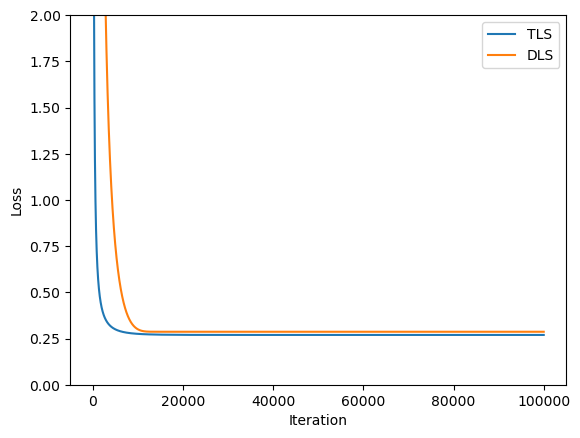

In [47]:
plt.ylim(0,2)
plt.xlabel('Iteration')
plt.ylabel('Loss')
plt.plot(loss_list_tls, label='TLS')
plt.plot(loss_list_dls, label='DLS')
plt.legend()

In [29]:
print(w0_tls, w1_tls)
print(w0_dls, w1_dls)
print(w0, w1)

-13.173050880432129 3.0594072341918945
3.9717142581939697 0.32011985778808594
[3.00190492] [0.47285907]


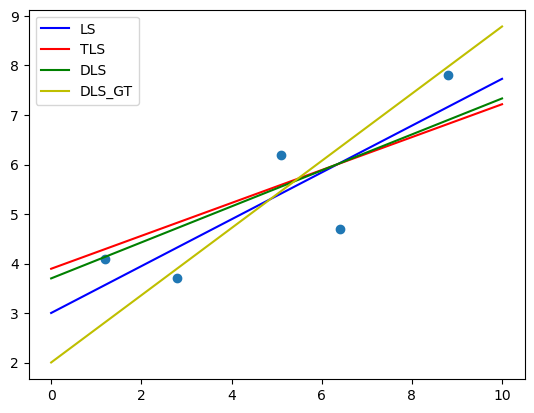

In [52]:
# plot 
import matplotlib.pyplot as plt
plt.scatter(x, y)
# plot y= w0 + w1*x
plt.plot([0,10], [w0, w0 + w1*10], color='b', label='LS')
plt.plot([0,10], [w0_tls, w0_tls + w1_tls*10], color='r', label='TLS')
plt.plot([0,10], [w0_dls, w0_dls + w1_dls*10], color='g', label='DLS')
plt.plot([0,10], [w0_dls_gt, w0_dls_gt + w1_dls_gt*10], color='y', label='DLS_GT')
# plot每一个点投影到数据线上的误差
plt.legend()

In [50]:

### Pisarenko 频率估计方法


import numpy as np

def generate_signal(A, f, N, snr_db):
    """ 生成带噪声的正弦信号。
    A: 幅度列表
    f: 频率列表
    N: 信号长度
    snr_db: 信噪比，单位为 dB
    """
    t = np.arange(N)
    signal = np.zeros(N)
    for a, freq in zip(A, f):
        signal += a * np.sin(2 * np.pi * freq * t)
    
    # 计算信号功率和噪声功率
    signal_power = np.mean(signal ** 2)
    noise_power = signal_power / (10 ** (snr_db / 10))
    
    # 添加高斯噪声
    noise = np.sqrt(noise_power) * np.random.randn(N)
    return signal + noise

from scipy.linalg import hankel, eig

def pisarenko(signal):
    """ 应用 Pisarenko 频率估计方法。
    signal: 输入信号
    """
    # 估计自相关
    autocorr = np.correlate(signal, signal, mode='full')
    autocorr = autocorr[len(autocorr)//2:]  # 只取非负延迟部分
    
    # 构建 Hankel 矩阵
    order = 4  # 正弦波数量
    hankel_matrix = hankel(autocorr[:order], autocorr[order-1:2*order-1])
    
    # 求解特征值和特征向量
    _, vecs = eig(hankel_matrix, right=True)
    min_eigvec = vecs[:, np.argmin(np.abs(_))]
    
    # 估计频率
    roots = np.roots(min_eigvec)
    angles = np.angle(roots)
    frequencies = angles / (2 * np.pi)
    return frequencies[frequencies > 0]  # 只返回正频率

# 参数定义
A = [1] * 4  # 假设幅度都为1
frequencies = [0.06, 0.13, 0.163, 0.19]
N = 500  # 信号长度
snr_db = 10  # 信噪比为10 dB

# 生成信号
signal = generate_signal(A, frequencies, N, snr_db)

# 应用 Pisarenko 方法
estimated_frequencies = pisarenko(signal)
print("估计的频率：", estimated_frequencies)

估计的频率： [0.5        0.17362863]


In [51]:

### MUSIC 频率估计方法

from numpy.linalg import svd

def music(signal, num_sources, N):
    """ 应用 MUSIC 频率估计方法。
    signal: 输入信号
    num_sources: 信号中源的数量
    N: 信号长度
    """
    # 估计自相关
    autocorr = np.correlate(signal, signal, mode='full')
    autocorr = autocorr[len(autocorr)//2:len(autocorr)//2+N]

    # 构建协方差矩阵
    R = hankel(autocorr[:N//2], autocorr[N//2-1:N-1])

    # SVD 分解
    U, s, Vh = svd(R)
    Un = U[:, num_sources:]  # 噪声子空间

    # 频率估计
    frequencies = []
    for f in np.linspace(0, 0.5, 1000):
        a = np.exp(-2j * np.pi * f * np.arange(N//2))
        spectrum = 1 / np.linalg.norm(Un.T.conj() @ a)
        frequencies.append(spectrum)
    
    # 选择最大的 num_sources 个峰值作为频率
    freq_indices = np.argsort(frequencies)[-num_sources:]
    estimated_freqs = np.sort(np.array(freq_indices) / 1000)
    return estimated_freqs
# 参数定义
A = [8] * 4  # 所有正弦波的幅度为8
frequencies = [0.06, 0.13, 0.163, 0.19]
signal_lengths = [10, 50, 100, 500]  # 不同的信号长度

for N in signal_lengths:
    print(f"\n信号长度: {N}")
    signal = generate_signal(A, frequencies, N, 10)  # 信噪比为10 dB

    # 应用 Pisarenko 方法
    pis_freqs = pisarenko(signal)
    print("Pisarenko 估计的频率:", pis_freqs)

    # 应用 MUSIC 方法
    music_freqs = music(signal, len(A), N)
    print("MUSIC 估计的频率:", music_freqs)


信号长度: 10
Pisarenko 估计的频率: [0.1682809]
MUSIC 估计的频率: [0.329 0.33  0.331 0.332]

信号长度: 50
Pisarenko 估计的频率: [0.5        0.17595577]
MUSIC 估计的频率: [0.389 0.39  0.391 0.392]

信号长度: 100
Pisarenko 估计的频率: [0.17651991]
MUSIC 估计的频率: [0.116 0.117 0.118 0.119]

信号长度: 500
Pisarenko 估计的频率: [0.5       0.1726693]
MUSIC 估计的频率: [0.378 0.379 0.38  0.381]
